In [2]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import hvplot.pandas
import plotly.express as px
import gmplot
import numpy as np

In [3]:
NYPD_df = pd.read_csv("Data/NYPD_Complaint_Data_Historic.csv")

/Users/weiqingwang/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning:

Columns (18,20) have mixed types. Specify dtype option on import or set low_memory=False.



In [208]:
#remove the rows that don't have date or time of occurrence
NYPD_df_datenn = NYPD_df[NYPD_df.CMPLNT_FR_DT.notnull() & NYPD_df.CMPLNT_FR_TM.notnull()]
NYPD_df_datenn.head()

,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,SUSP_SEX,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX
0,577055921,12/31/2018,19:00:00,12/31/2018,19:35:00,75.0,12/31/2018,361,OFF. AGNST PUB ORD SENSBLTY &,639.0,...,F,NaN,40.667447,-73.872377,"(40.667446665, -73.872377258)",PATROL BORO BKLYN NORTH,NaN,18-24,BLACK,M
1,311304275,12/31/2018,15:00:00,12/31/2018,16:00:00,41.0,12/31/2018,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,F,NaN,40.815765,-73.885857,"(40.815765327, -73.885857339)",PATROL BORO BRONX,NaN,18-24,WHITE HISPANIC,F
2,427481098,12/31/2018,18:00:00,12/31/2018,18:30:00,14.0,12/31/2018,109,GRAND LARCENY,410.0,...,NaN,NaN,40.748767,-73.985320,"(40.748767014, -73.985319659)",PATROL BORO MAN SOUTH,NaN,18-24,UNKNOWN,F
3,212387335,12/31/2018,16:50:00,12/31/2018,17:00:00,81.0,12/31/2018,106,FELONY ASSAULT,109.0,...,M,NaN,40.684616,-73.918933,"(40.684616294, -73.918932657)",PATROL BORO BKLYN NORTH,NaN,25-44,BLACK,M
4,629543587,12/31/2018,00:45:00,12/31/2018,01:00:00,26.0,12/31/2018,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,F,NaN,40.805469,-73.963840,"(40.805468548, -73.963840045)",PATROL BORO MAN NORTH,NaN,25-44,WHITE HISPANIC,M


In [209]:
#remove rows that are before 2006
NYPD_df_cleaned = NYPD_df_datenn.loc[NYPD_df_datenn.CMPLNT_FR_DT.str[-4:].astype(int) > 2006,:]

In [210]:
#combine date and time into one column
NYPD_df_cleaned['occur_date_time']= NYPD_df_cleaned.CMPLNT_FR_DT + " " + NYPD_df_datenn.CMPLNT_FR_TM
NYPD_df_cleaned.head()

/Users/weiqingwang/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,CMPLNT_NUM,CMPLNT_FR_DT,CMPLNT_FR_TM,CMPLNT_TO_DT,CMPLNT_TO_TM,ADDR_PCT_CD,RPT_DT,KY_CD,OFNS_DESC,PD_CD,...,TRANSIT_DISTRICT,Latitude,Longitude,Lat_Lon,PATROL_BORO,STATION_NAME,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,occur_date_time
0,577055921,12/31/2018,19:00:00,12/31/2018,19:35:00,75.0,12/31/2018,361,OFF. AGNST PUB ORD SENSBLTY &,639.0,...,NaN,40.667447,-73.872377,"(40.667446665, -73.872377258)",PATROL BORO BKLYN NORTH,NaN,18-24,BLACK,M,12/31/2018 19:00:00
1,311304275,12/31/2018,15:00:00,12/31/2018,16:00:00,41.0,12/31/2018,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.815765,-73.885857,"(40.815765327, -73.885857339)",PATROL BORO BRONX,NaN,18-24,WHITE HISPANIC,F,12/31/2018 15:00:00
2,427481098,12/31/2018,18:00:00,12/31/2018,18:30:00,14.0,12/31/2018,109,GRAND LARCENY,410.0,...,NaN,40.748767,-73.985320,"(40.748767014, -73.985319659)",PATROL BORO MAN SOUTH,NaN,18-24,UNKNOWN,F,12/31/2018 18:00:00
3,212387335,12/31/2018,16:50:00,12/31/2018,17:00:00,81.0,12/31/2018,106,FELONY ASSAULT,109.0,...,NaN,40.684616,-73.918933,"(40.684616294, -73.918932657)",PATROL BORO BKLYN NORTH,NaN,25-44,BLACK,M,12/31/2018 16:50:00
4,629543587,12/31/2018,00:45:00,12/31/2018,01:00:00,26.0,12/31/2018,344,ASSAULT 3 & RELATED OFFENSES,101.0,...,NaN,40.805469,-73.963840,"(40.805468548, -73.963840045)",PATROL BORO MAN NORTH,NaN,25-44,WHITE HISPANIC,M,12/31/2018 00:45:00


In [164]:
#NYPD_df_cleaned['occur_date_time'] = pd.to_datetime(NYPD_df_cleaned['occur_date_time'])

/Users/weiqingwang/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [165]:
#NYPD_df_cleaned['CMPLNT_FR_DT'] = pd.to_datetime(NYPD_df_cleaned['CMPLNT_FR_DT'])

/Users/weiqingwang/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [169]:
#select crimes that are completed
NYPD_df_cleaned= NYPD_df_cleaned[NYPD_df_cleaned['CRM_ATPT_CPTD_CD']=='COMPLETED']

KeyError: 'CRM_ATPT_CPTD_CD'

In [212]:
NYPD_df_cleaned.columns

Index(['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'CMPLNT_TO_DT',
       'CMPLNT_TO_TM', 'ADDR_PCT_CD', 'RPT_DT', 'KY_CD', 'OFNS_DESC', 'PD_CD',
       'PD_DESC', 'CRM_ATPT_CPTD_CD', 'LAW_CAT_CD', 'BORO_NM',
       'LOC_OF_OCCUR_DESC', 'PREM_TYP_DESC', 'JURIS_DESC', 'JURISDICTION_CODE',
       'PARKS_NM', 'HADEVELOPT', 'HOUSING_PSA', 'X_COORD_CD', 'Y_COORD_CD',
       'SUSP_AGE_GROUP', 'SUSP_RACE', 'SUSP_SEX', 'TRANSIT_DISTRICT',
       'Latitude', 'Longitude', 'Lat_Lon', 'PATROL_BORO', 'STATION_NAME',
       'VIC_AGE_GROUP', 'VIC_RACE', 'VIC_SEX', 'occur_date_time'],
      dtype='object')

In [213]:
#select columns we need
NYPD_df_cleaned_col = NYPD_df_cleaned[['CMPLNT_NUM', 'CMPLNT_FR_DT', 'CMPLNT_FR_TM', 'OFNS_DESC', 'PD_DESC', 'LAW_CAT_CD', 'BORO_NM', 'X_COORD_CD', 'Y_COORD_CD', 'SUSP_AGE_GROUP', 'SUSP_RACE', 'SUSP_SEX', 'Latitude', 'Longitude', 'Lat_Lon', 'PATROL_BORO','VIC_AGE_GROUP','VIC_RACE', 'VIC_SEX', 'occur_date_time']]

In [214]:
#change column names
NYPD_df_cleaned_col.columns = ['complaint_number', 'complaint_date', 'complaint_time', 'offense_type', 'offense_detail', 'offense_level', 'boro_name', 'X_COORD', 'Y_COORD', 'SUSP_AGE_GROUP', 'SUSP_RACE', 'SUSP_SEX', 'Latitude', 'Longitude', 'Lat_Lon', 'PATROL_BORO', 'VIC_AGE_GROUP', 'VIC_RACE', 'VIC_SEX', 'occur_date_time']

In [217]:
NYPD_df_cleaned_col = NYPD_df_cleaned_col[NYPD_df_cleaned_col.offense_type.notnull() & (NYPD_df_cleaned_col.boro_name.notnull() & NYPD_df_cleaned_col.Latitude.notnull())]

In [221]:
NYPD_df_cleaned_col.isnull().sum()

complaint_number          0
complaint_date            0
complaint_time            0
offense_type              0
offense_detail            0
offense_level             0
boro_name                 0
X_COORD                   0
Y_COORD                   0
SUSP_AGE_GROUP      4026980
SUSP_RACE           2830470
SUSP_SEX            2930183
Latitude                  0
Longitude                 0
Lat_Lon                   0
PATROL_BORO              71
VIC_AGE_GROUP       1433351
VIC_RACE                287
VIC_SEX                 286
occur_date_time           0
dtype: int64

In [42]:
NYPD_df_cleaned_col.to_csv('/Users/weiqingwang/Dropbox/fintech_hw/Project-1/Data/cleaned_NYPD_df.csv', index=False)

NameError: name 'NYPD_df_cleaned_col' is not defined

In [3]:
NYPD_df_cleaned = pd.read_csv("Data/cleaned_NYPD_df.csv", parse_dates=['complaint_date', 'occur_date_time'], infer_datetime_format=True)

In [62]:
NYPD_df_cleaned.head()

,complaint_number,complaint_date,complaint_time,offense_type,offense_detail,offense_level,boro_name,X_COORD,Y_COORD,SUSP_AGE_GROUP,SUSP_RACE,SUSP_SEX,Latitude,Longitude,Lat_Lon,PATROL_BORO,VIC_AGE_GROUP,VIC_RACE,VIC_SEX,occur_date_time
0,577055921,2018-12-31,19:00:00,OFF. AGNST PUB ORD SENSBLTY &,AGGRAVATED HARASSMENT 2,MISDEMEANOR,BROOKLYN,1019655.0,182468.0,<18,BLACK,F,40.667447,-73.872377,"(40.667446665, -73.872377258)",PATROL BORO BKLYN NORTH,18-24,BLACK,M,2018-12-31 19:00:00
1,311304275,2018-12-31,15:00:00,ASSAULT 3 & RELATED OFFENSES,ASSAULT 3,MISDEMEANOR,BRONX,1015845.0,236500.0,25-44,WHITE HISPANIC,F,40.815765,-73.885857,"(40.815765327, -73.885857339)",PATROL BORO BRONX,18-24,WHITE HISPANIC,F,2018-12-31 15:00:00
2,427481098,2018-12-31,18:00:00,GRAND LARCENY,"LARCENY,GRAND FROM RETAIL STORE, UNATTENDED",FELONY,MANHATTAN,988318.0,212070.0,NaN,NaN,NaN,40.748767,-73.985320,"(40.748767014, -73.985319659)",PATROL BORO MAN SOUTH,18-24,UNKNOWN,F,2018-12-31 18:00:00
3,629543587,2018-12-31,00:45:00,ASSAULT 3 & RELATED OFFENSES,ASSAULT 3,MISDEMEANOR,MANHATTAN,994261.0,232730.0,18-24,BLACK,F,40.805469,-73.963840,"(40.805468548, -73.963840045)",PATROL BORO MAN NORTH,25-44,WHITE HISPANIC,M,2018-12-31 00:45:00
4,447893395,2018-12-31,20:05:00,MISCELLANEOUS PENAL LAW,CRIMINAL CONTEMPT 1,FELONY,BROOKLYN,1019171.0,189808.0,25-44,WHITE HISPANIC,M,40.687595,-73.874084,"(40.687595212, -73.874083895)",PATROL BORO BKLYN NORTH,18-24,WHITE HISPANIC,M,2018-12-31 20:05:00


In [45]:
gdp_df = pd.read_csv("Data/GDPC1.csv", parse_dates=['DATE'], infer_datetime_format=True, index_col='DATE')
gdp_df.head()

,GDPC1
DATE,
1947-01-01,2033.061
1947-04-01,2027.639
1947-07-01,2023.452
1947-10-01,2055.103
1948-01-01,2086.017


In [46]:
unrate_df = pd.read_csv("Data/UNRATE.csv", parse_dates=['DATE'], infer_datetime_format=True, index_col='DATE')
unrate_df.head()

,UNRATE
DATE,
1948-01-01,3.4
1948-02-01,3.8
1948-03-01,4.0
1948-04-01,3.9
1948-05-01,3.5


In [4]:
complaint_by_month = NYPD_df_cleaned.groupby(pd.Grouper(key='complaint_date', freq='MS')).complaint_number.count()
complaint_by_year = NYPD_df_cleaned.groupby(pd.Grouper(key='complaint_date', freq='YS')).complaint_number.count()
complaint_by_quarter = NYPD_df_cleaned.groupby(pd.Grouper(key='complaint_date', freq='QS')).complaint_number.count()

In [8]:
complaint_by_month.to_csv("Data/complaint_by_month.csv", header=False)

In [67]:
complaint_by_year = NYPD_df_cleaned.groupby(by=[pd.Grouper(key='complaint_date', freq='YS'), 'offense_level']).complaint_number.count()

DatetimeIndex(['2007-01-01', '2007-01-01', '2007-01-01', '2008-01-01',
               '2008-01-01', '2008-01-01', '2009-01-01', '2009-01-01',
               '2009-01-01', '2010-01-01', '2010-01-01', '2010-01-01',
               '2011-01-01', '2011-01-01', '2011-01-01', '2012-01-01',
               '2012-01-01', '2012-01-01', '2013-01-01', '2013-01-01',
               '2013-01-01', '2014-01-01', '2014-01-01', '2014-01-01',
               '2015-01-01', '2015-01-01', '2015-01-01', '2016-01-01',
               '2016-01-01', '2016-01-01', '2017-01-01', '2017-01-01',
               '2017-01-01', '2018-01-01', '2018-01-01', '2018-01-01'],
              dtype='datetime64[ns]', name='complaint_date', freq='AS-JAN')

In [85]:
complaint_by_year.index = complaint_by_year.index.set_levels(complaint_by_year.index.levels[0].year, level=0)

In [87]:
complaint_by_year.head()

complaint_date  offense_level
2007            FELONY           159808
                MISDEMEANOR      297303
                VIOLATION         65770
2008            FELONY           156976
                MISDEMEANOR      297569
Name: complaint_number, dtype: int64

In [92]:
felony_by_year = complaint_by_year[complaint_by_year.index.get_level_values('offense_level')=='FELONY']
misdemeanor_by_year = complaint_by_year[complaint_by_year.index.get_level_values('offense_level')=='MISDEMEANOR']
violation_by_year = complaint_by_year[complaint_by_year.index.get_level_values('offense_level')=='VIOLATION']

In [103]:
bars = np.array(misdemeanor_by_year.tolist()) +  np.array(violation_by_year.tolist())

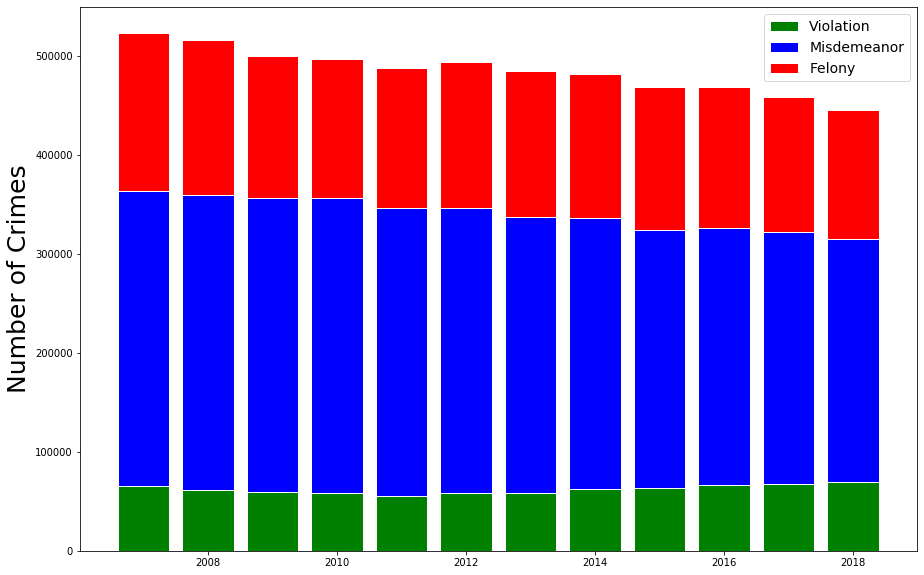

In [149]:
plt.figure(figsize=(15,10))
b1=plt.bar(complaint_by_year.index.levels[0], violation_by_year, color='green', edgecolor='white')
b2=plt.bar(complaint_by_year.index.levels[0], misdemeanor_by_year, bottom=violation_by_year, color='blue', edgecolor='white')
b3=plt.bar(complaint_by_year.index.levels[0], felony_by_year, bottom=bars, color='red', edgecolor='white')
plt.ylabel("Number of Crimes", fontsize=25)
plt.legend((b1[0],b2[0],b3[0]), ("Violation", 'Misdemeanor', 'Felony'), prop={'size': 14})
plt.savefig("Graphs/crimes_by_year.png")

In [138]:
NYPD_df_cleaned['hour'] = NYPD_df_cleaned.occur_date_time.apply(lambda x : x.hour)

In [165]:
complaint_by_hour = NYPD_df_cleaned.groupby(by=['hour', 'offense_level']).complaint_number.count()

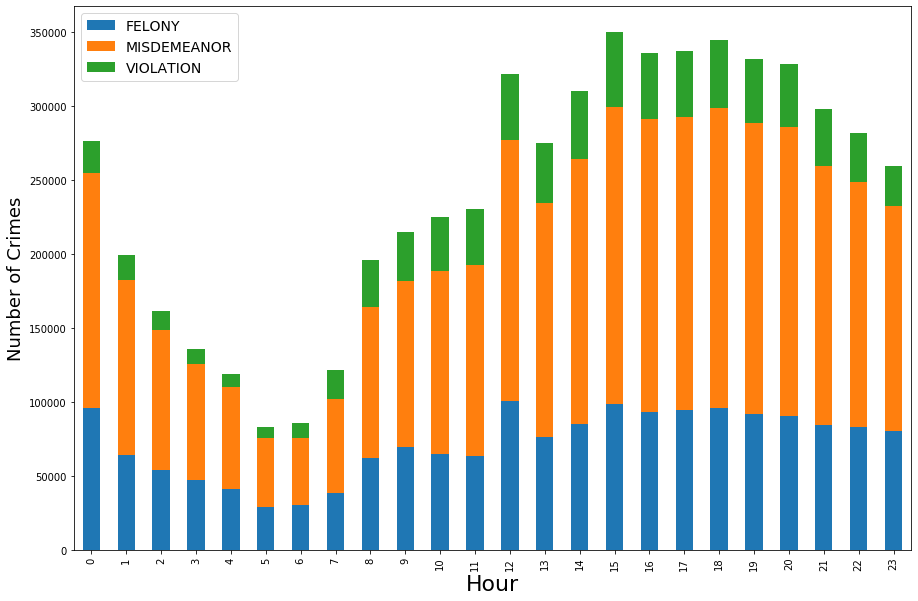

In [166]:
complaint_by_hour = complaint_by_hour.unstack()
complaint_by_hour_fig = complaint_by_hour.plot(kind='bar', stacked=True, figsize=(15,10))
complaint_by_hour_fig.set_ylabel("Number of Crimes", fontsize=18)
complaint_by_hour_fig.set_xlabel("Hour", fontsize=22)
plt.legend(prop={'size': 14})
plt.savefig("Graphs/crimes_by_hour.png")

In [143]:
complaint_unrate = pd.concat([unrate_df,complaint_by_month], join='inner', axis=1).reset_index()
complaint_unrate['index'] = pd.to_datetime(complaint_unrate['index'])
complaint_unrate.head()

,index,UNRATE,complaint_number
0,2007-01-01,4.6,43783
1,2007-02-01,4.5,35794
2,2007-03-01,4.4,42510
3,2007-04-01,4.5,41399
4,2007-05-01,4.4,46367


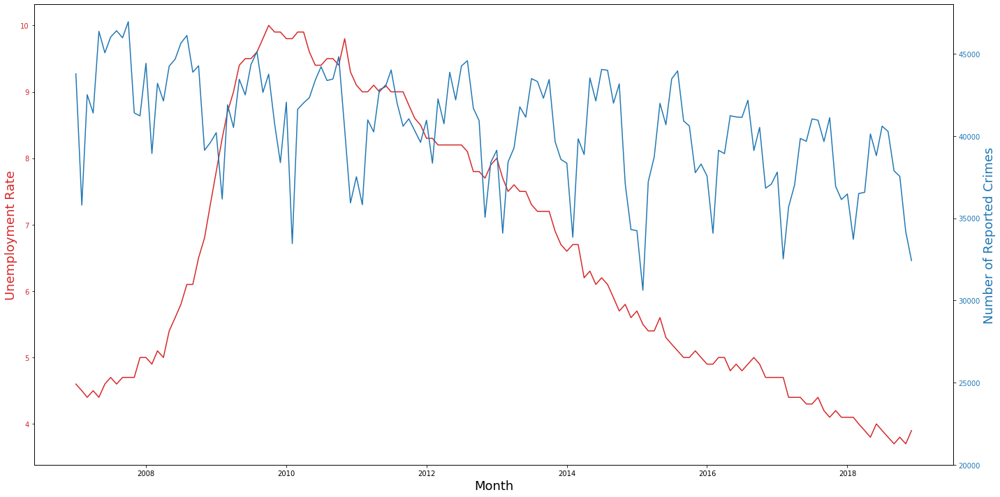

In [147]:
fig, ax1 = plt.subplots(figsize=(20,10))
color = 'tab:red'
ax1.set_xlabel('Month', fontsize=18)
ax1.set_ylabel('Unemployment Rate', color=color, fontsize=18)
ax1.plot(complaint_unrate['index'], complaint_unrate.UNRATE, color=color)
ax1.tick_params(axis='y', labelcolor=color)


ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Number of Reported Crimes', color=color, fontsize=18)
ax2.plot(complaint_unrate['index'], complaint_unrate.complaint_number, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.set_ylim(20000,48000)
fig.tight_layout()
plt.savefig("Graphs/crime_vs_unemployment.png")


In [1]:
complaint_gdp = pd.concat([gdp_df,complaint_by_quarter], join='inner', axis=1).reset_index()
complaint_gdp.head()

NameError: name 'pd' is not defined

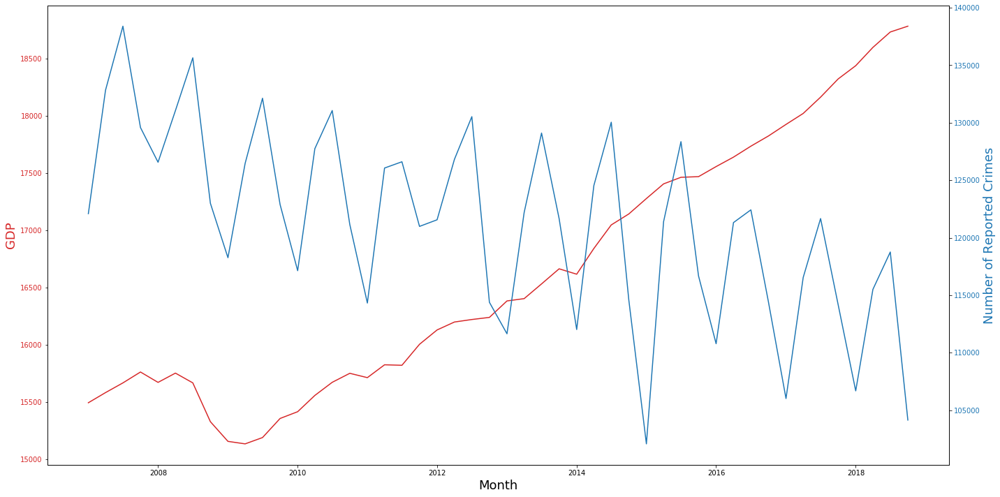

In [148]:
fig, ax1 = plt.subplots(figsize=(20,10))
color = 'tab:red'
ax1.set_xlabel('Month', fontsize=18)
ax1.set_ylabel('GDP', color=color, fontsize=18)
ax1.plot(complaint_gdp['index'], complaint_gdp.GDPC1, color=color)
ax1.tick_params(axis='y', labelcolor=color)


ax2 = ax1.twinx()
color = 'tab:blue'
ax2.set_ylabel('Number of Reported Crimes', color=color, fontsize=18)
ax2.plot(complaint_gdp['index'], complaint_gdp.complaint_number, color=color)
ax2.tick_params(axis='y', labelcolor=color)
#ax2.set_ylim(20000,48000)
fig.tight_layout()
plt.savefig("Graphs/crime_vs_gdp.png")

In [177]:
crime_type = NYPD_df_cleaned.offense_type.value_counts()
crime_type_felony = NYPD_df_cleaned[NYPD_df_cleaned['offense_level']=="FELONY"].offense_type.value_counts()
crime_type_misdemeanor = NYPD_df_cleaned[NYPD_df_cleaned['offense_level']=="MISDEMEANOR"].offense_type.value_counts()
crime_type_violation = NYPD_df_cleaned[NYPD_df_cleaned['offense_level']=="VIOLATION"].offense_type.value_counts()

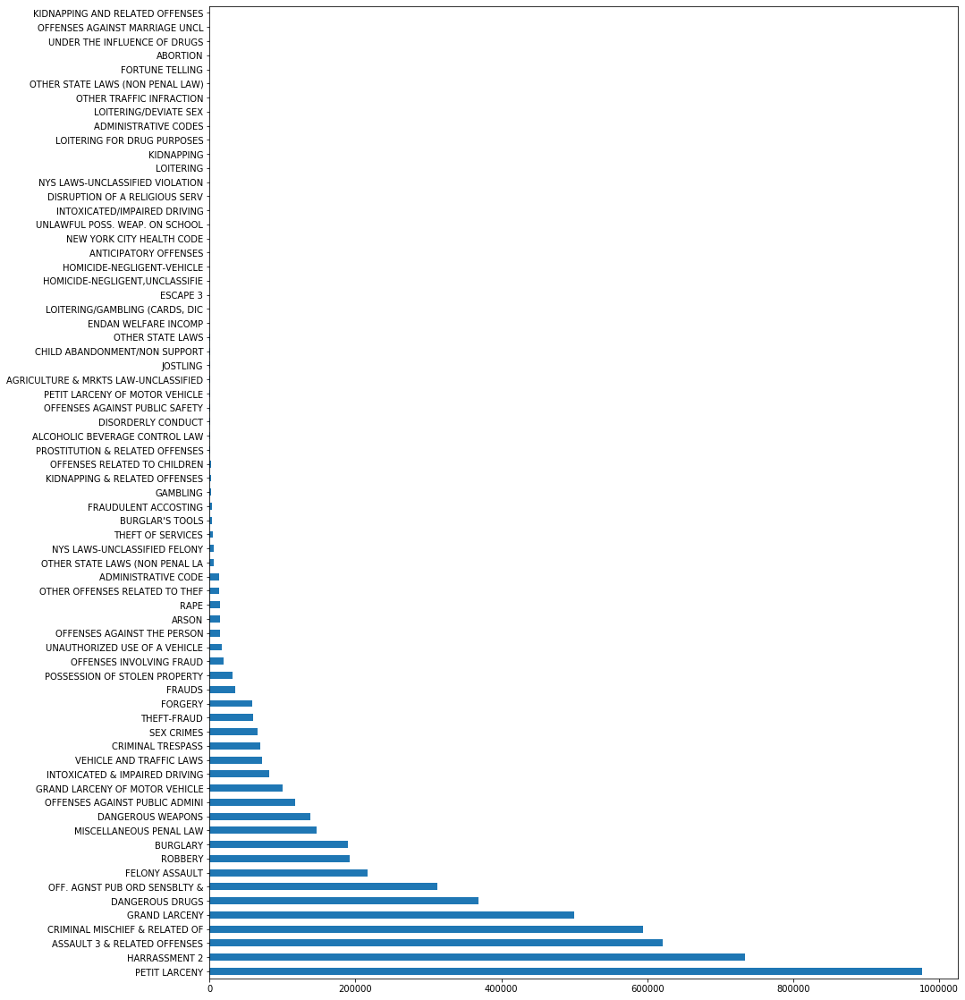

In [171]:
crimetype_fig = crime_type.plot(kind='barh', figsize=(15,20))
plt.savefig("Graphs/crimetype_fig.png")

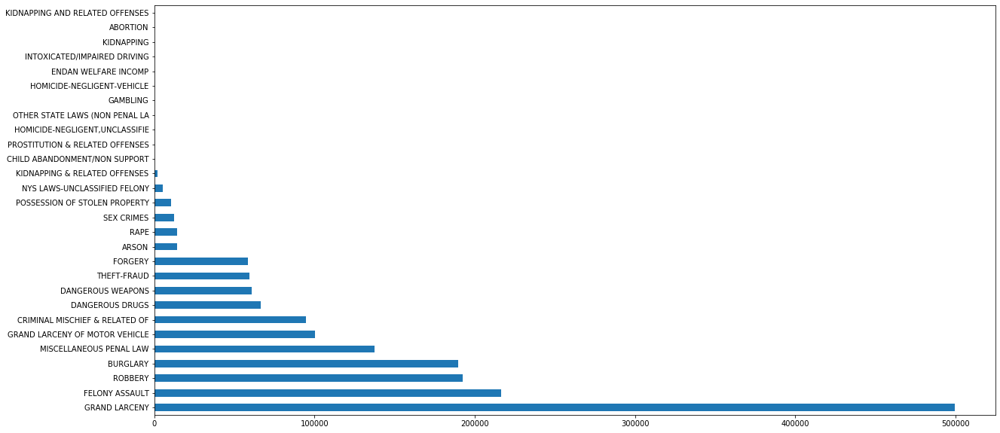

In [181]:
crimetype_fig = crime_type_felony.plot(kind='barh', figsize=(15,10))
plt.savefig("Graphs/crimetype_felony_fig.png")

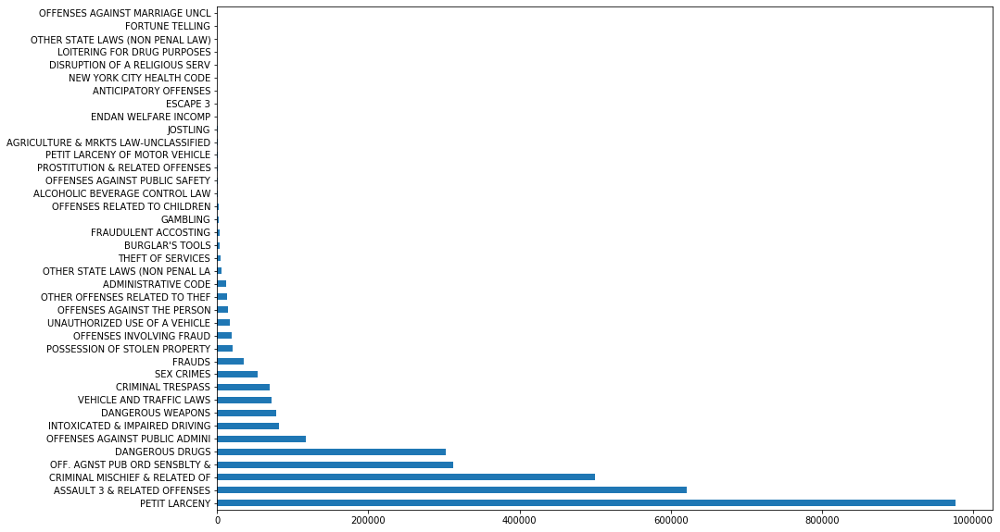

In [178]:
crimetype_fig = crime_type_misdemeanor.plot(kind='barh', figsize=(15,10))
plt.savefig("Graphs/crimetype_misdemeanor_fig.png")

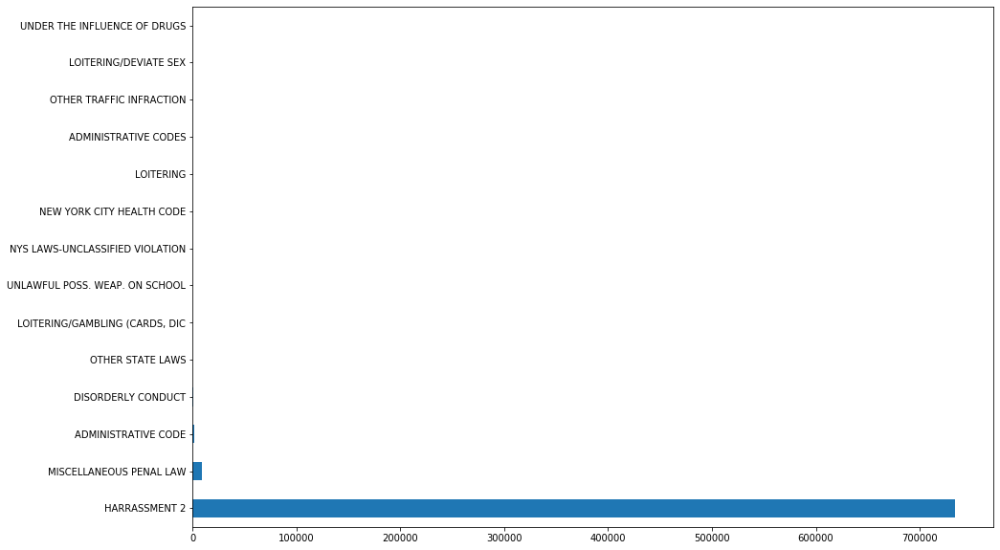

In [179]:
crimetype_fig = crime_type_violation.plot(kind='barh', figsize=(15,10))
plt.savefig("Graphs/crimetype_violation_fig.png")

In [40]:
#map_box_api = os.getenv("mapbox")
#px.set_mapbox_access_token(map_box_api)

In [150]:
NYPD_df_cleaned_sub = NYPD_df_cleaned.sample(100000)
NYPD_df_cleaned_felony = NYPD_df_cleaned[NYPD_df_cleaned.offense_level=='FELONY'].sample(100000)
NYPD_df_cleaned_misemeanor = NYPD_df_cleaned[NYPD_df_cleaned.offense_level=='MISDEMEANOR'].sample(100000)
NYPD_df_cleaned_violation = NYPD_df_cleaned[NYPD_df_cleaned.offense_level=='VIOLATION'].sample(100000)

In [10]:
px.scatter_mapbox(NYPD_df_cleaned_sub, lat="Latitude", lon="Longitude", color="offense_level")

In [117]:
latitudes = NYPD_df_cleaned_felony['Latitude']
longitudes = NYPD_df_cleaned_felony['Longitude']

In [152]:
gmap = gmplot.GoogleMapPlotter(40.748767, -73.985320, 12)
gmap.heatmap(latitudes, longitudes)

In [153]:
gmap.draw("Graphs/my_heatmap_misdemeanor.html")